# **SET-UP**

In this section, the relavant libraries are imported, and the training, validation and test datasets are prepared.

If the notebook is running on Google Colab, the data can be downloaded to the environment by running the corresponding cell.

In [1]:
# imports

import os
import sys
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional
from torchvision import transforms

import matplotlib.pyplot as plt
import numpy as np

import cv2
from PIL import Image

### Download Data into Google Colab Environment

This cell should only be executed if the notebook is running on Google Colab.

If the notebook is running locally with the data already situated in the correct directory, this cell block should **not** be run.

In [2]:
# download if zip files not already downloaded
if not os.path.exists('data.zip'):
    !gdown '1KCEr8wD4vGuYhop8ShshLFPnx-3wzeSW'
else:
    print('data.zip already exists')

# unzip if folders don't already exist
if not os.path.exists('data'):
    !unzip -qq data.zip
    !rm data.zip
else:
    print('data folder already exists')

Downloading...
From (original): https://drive.google.com/uc?id=1KCEr8wD4vGuYhop8ShshLFPnx-3wzeSW
From (redirected): https://drive.google.com/uc?id=1KCEr8wD4vGuYhop8ShshLFPnx-3wzeSW&confirm=t&uuid=af29b6a9-7c76-47f1-a120-1bac16368f8f
To: /content/data.zip
100% 289M/289M [00:06<00:00, 43.3MB/s]


## Constructing Datasets

Informally experimenting with various batch sizes,demonstrated that a batch size of four yielded the best results.

In [3]:
# batch size
B = 4

The appropriate transformations can be applied for training, validation and test data.

In [4]:
from torch.utils.data import DataLoader
from utils.seq_dataset import SeqDataset

# transformations for training data
train_transform = transforms.Compose([
        transforms.RandomResizedCrop(size=256, scale=(0.8, 1.0)),
        transforms.RandomRotation(degrees=15),
        transforms.ColorJitter(brightness=0.5),
        transforms.RandomHorizontalFlip(),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

# transformations for validation data
valid_transform = transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

# transformations for test data
test_transform = transforms.Compose([
        transforms.Resize(size=256),
        transforms.CenterCrop(size=224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

# set up dataset
dataset = SeqDataset(root_dir='data', transform=None)

The dataset is split into 60% for training data, 10% for validation data, and 30% for test data.

In [5]:
from torch.utils.data import random_split, DataLoader

# picking out the sizes
train_size = int(0.6 * len(dataset))              # 60% for training
val_size = int(0.1 * len(dataset))                # 10% for validation
test_size = len(dataset) - train_size - val_size  # 30 for testing

# split the dataset into train, validation, and test sets
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# apply transformations
train_dataset.dataset.transform = train_transform  # assign training transform
val_dataset.dataset.transform = valid_transform    # assign validation transform
test_dataset.dataset.transform = test_transform    # assign test transform

# dataloaders
train_loader = DataLoader(train_dataset, batch_size=B, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=B, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=B, shuffle=False)

### Visualize Data

This cell can be optionally executed to visualize the structure of the dataset.

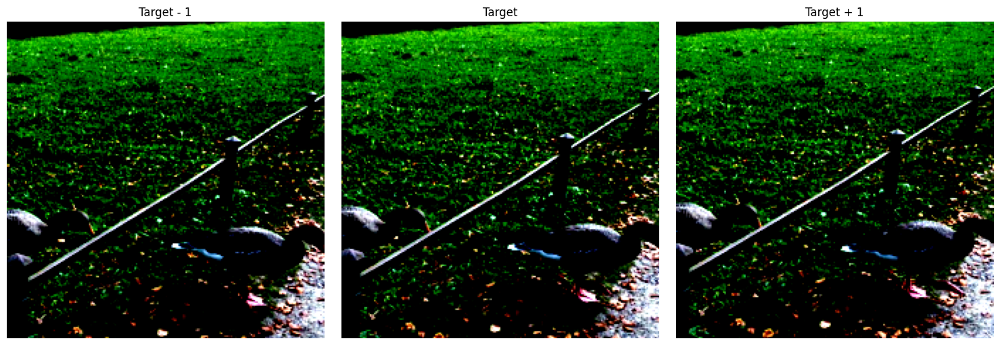

In [6]:
tgt, [s1, s2] = train_dataset[10]
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Target - 1")
plt.imshow(s1.permute(1, 2, 0).numpy())
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Target")
plt.imshow(tgt.permute(1, 2, 0).numpy())
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Target + 1")
plt.imshow(s2.permute(1, 2, 0).numpy())
plt.axis('off')

plt.tight_layout()
plt.show()

# **TRAINING**

In this section the depth estimation model will be trained, using the optimization of the pose estimation model as an auxillery task. This architecture and training set-up is based on the *Monodepth2* architecture. \\

The performance of the depth models trained with three different learning rates over 100 epochs will be compared to determine which is the most effective. Specifically, Version A will train with a learning rate of 1e-4, Version B will use 1e-5, and Version C will use 1e-6. <br>

Versions beyond these three models will be created experimentally based on the performance of A, B, C to further explore the impact of the learning rate and other factors.

In [7]:
from depth_net import DepthNet
from pose_net import PoseNet
from depth_trainer import DepthTrainer

# set up device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# set up standard intrinsics
intrinsics = torch.eye(3).unsqueeze(0).repeat(B, 1, 1).to(device)

#### Helper Function

To visualize the training loss over epochs for each version.

In [8]:
import matplotlib.pyplot as plt

# plot training loss over epochs
def plot_train_loss(trainer, num_epochs=100):
  # load values
  epochs = list(range(1, num_epochs + 1))
  losses = trainer.get_loss()

  # plot graph
  plt.figure(figsize=(8, 5))
  plt.scatter(epochs, losses, color='blue', label='Training Loss per Epoch')
  plt.plot(epochs, losses, color='lightblue', linestyle='--')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Training Loss over Epochs')
  plt.grid(True)
  plt.legend()
  plt.tight_layout()
  plt.show()

## Version A: LR=1e-4


It was informally established after training the Version A model numerous times, that when training with a learning rate of 1e-4, the loss will eventually fluctuate between 0.3 and 0.32 around 40 epochs. For the purpose of saving GPU compute while training, the training loop will only run for 60 epochs instead of 100.

In [ ]:
# load models
depth_A = DepthNet().to(device)
pose_A = PoseNet().to(device)

# set up parameters
params = list(depth_A.parameters()) + list(pose_A.parameters())

# optimizer with learning rate 1e-4
optimizer = torch.optim.Adam(params, lr=1e-4)

# load depth network trainer
trainer_A = DepthTrainer(depth_A, pose_A, optimizer, intrinsics, train_loader, device, epochs=60)

In [ ]:
# train model A
trainer_A.train()


EPOCH 1 -----------------------------
[average loss: 1.0724]

EPOCH 2 -----------------------------
[average loss: 1.0288]

EPOCH 3 -----------------------------
[average loss: 0.9675]

EPOCH 4 -----------------------------
[average loss: 0.8138]

EPOCH 5 -----------------------------
[average loss: 0.5424]

EPOCH 6 -----------------------------
[average loss: 0.4112]

EPOCH 7 -----------------------------
[average loss: 0.3797]

EPOCH 8 -----------------------------
[average loss: 0.3509]

EPOCH 9 -----------------------------
[average loss: 0.3444]

EPOCH 10 -----------------------------
[average loss: 0.3379]

EPOCH 11 -----------------------------
[average loss: 0.3301]

EPOCH 12 -----------------------------
[average loss: 0.3283]

EPOCH 13 -----------------------------
[average loss: 0.3344]

EPOCH 14 -----------------------------
[average loss: 0.3385]

EPOCH 15 -----------------------------
[average loss: 0.3212]

EPOCH 16 -----------------------------
[average loss: 0.3253]



## Version B: LR=1e-5

In [ ]:
# load models
depth_B = DepthNet().to(device)
pose_B = PoseNet().to(device)

# set up parameters
params = list(depth_B.parameters()) + list(pose_B.parameters())

# optimizer with learning rate 1e-5
optimizer = torch.optim.Adam(params, lr=1e-5)

# load depth network trainer
trainer_B = DepthTrainer(depth_B, pose_B, optimizer, intrinsics, train_loader, device, epochs=100)

In [ ]:
# train model B
trainer_B.train()


EPOCH 1 -----------------------------
[average loss: 1.0291]

EPOCH 2 -----------------------------
[average loss: 0.9861]

EPOCH 3 -----------------------------
[average loss: 0.9134]

EPOCH 4 -----------------------------
[average loss: 0.8689]

EPOCH 5 -----------------------------
[average loss: 0.8223]

EPOCH 6 -----------------------------
[average loss: 0.8110]

EPOCH 7 -----------------------------
[average loss: 0.7934]

EPOCH 8 -----------------------------
[average loss: 0.7650]

EPOCH 9 -----------------------------
[average loss: 0.7571]

EPOCH 10 -----------------------------
[average loss: 0.7576]

EPOCH 11 -----------------------------
[average loss: 0.7506]

EPOCH 12 -----------------------------
[average loss: 0.7425]

EPOCH 13 -----------------------------
[average loss: 0.7213]

EPOCH 14 -----------------------------
[average loss: 0.7199]

EPOCH 15 -----------------------------
[average loss: 0.7150]

EPOCH 16 -----------------------------
[average loss: 0.7176]



## Version C: LR=1e-6

In [ ]:
# load models
depth_C = DepthNet().to(device)
pose_C = PoseNet().to(device)

# set up parameters
params = list(depth_C.parameters()) + list(pose_C.parameters())

# optimizer with learning rate 1e-6
optimizer = torch.optim.Adam(params, lr=1e-6)

# load depth network trainer
trainer_C = DepthTrainer(depth_C, pose_C, optimizer, intrinsics, train_loader, device, epochs=100)

In [ ]:
# train model C
trainer_C.train()


EPOCH 1 -----------------------------
[average loss: 1.0317]

EPOCH 2 -----------------------------
[average loss: 1.0320]

EPOCH 3 -----------------------------
[average loss: 1.0310]

EPOCH 4 -----------------------------
[average loss: 1.0280]

EPOCH 5 -----------------------------
[average loss: 1.0235]

EPOCH 6 -----------------------------
[average loss: 1.0161]

EPOCH 7 -----------------------------
[average loss: 1.0016]

EPOCH 8 -----------------------------
[average loss: 1.0005]

EPOCH 9 -----------------------------
[average loss: 0.9686]

EPOCH 10 -----------------------------
[average loss: 0.9559]

EPOCH 11 -----------------------------
[average loss: 0.9468]

EPOCH 12 -----------------------------
[average loss: 0.9397]

EPOCH 13 -----------------------------
[average loss: 0.9338]

EPOCH 14 -----------------------------
[average loss: 0.9319]

EPOCH 15 -----------------------------
[average loss: 0.9283]

EPOCH 16 -----------------------------
[average loss: 0.9263]



## Version D: LR=1e-4 with smoothing

In [10]:
# load models
depth_D = DepthNet().to(device)
pose_D = PoseNet().to(device)

# set up parameters
params = list(depth_D.parameters()) + list(pose_D.parameters())

# optimizer with learning rate 1e-4
optimizer = torch.optim.Adam(params, lr=1e-4)

# load depth network trainer
trainer_D = DepthTrainer(depth_D, pose_D, optimizer, intrinsics, train_loader, device, epochs=100)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 217MB/s]


In [11]:
# train model D
trainer_D.train()


EPOCH 1 -----------------------------
[average loss: 1.0796]

EPOCH 2 -----------------------------
[average loss: 1.0800]

EPOCH 3 -----------------------------
[average loss: 1.0963]

EPOCH 4 -----------------------------
[average loss: 1.0940]

EPOCH 5 -----------------------------
[average loss: 1.1018]

EPOCH 6 -----------------------------
[average loss: 1.0923]

EPOCH 7 -----------------------------
[average loss: 1.1176]

EPOCH 8 -----------------------------
[average loss: 1.0763]

EPOCH 9 -----------------------------
[average loss: 1.1020]

EPOCH 10 -----------------------------
[average loss: 1.1014]

EPOCH 11 -----------------------------
[average loss: 1.0833]

EPOCH 12 -----------------------------
[average loss: 1.0680]

EPOCH 13 -----------------------------
[average loss: 1.0496]

EPOCH 14 -----------------------------
[average loss: 1.0335]

EPOCH 15 -----------------------------
[average loss: 0.9373]

EPOCH 16 -----------------------------
[average loss: 0.5799]



## Analysis

#### Version A

The loss is quickly reduced, however after approximately 30 epochs, it appears that the model's learning plateus. For the remaining epochs, the loss fluctuates within the range of 0.30 to 0.32 approximately, and it does not reduce further. \\
This can imply that the learning rate is too big and has reached a point on the curve where it oscillates. Alternatively this could mean the learning has converged to some local minimum. \\

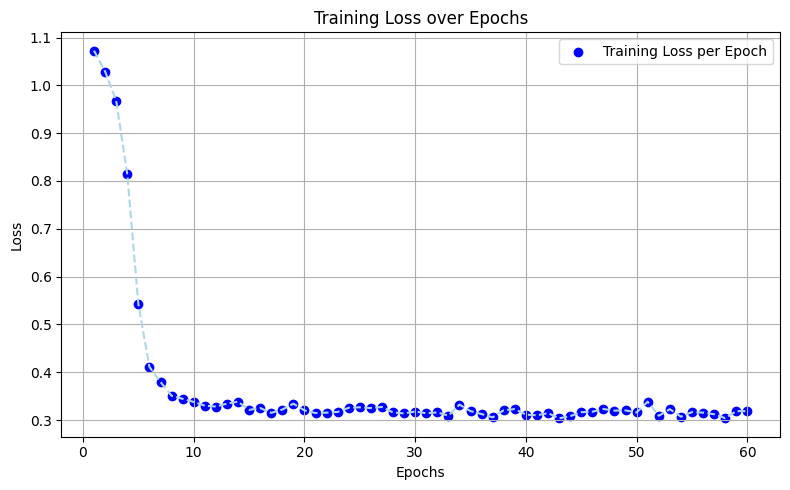

In [ ]:
plot_train_loss(trainer_A, 60)

#### Version B

The loss rapidly reduces in the first 10 epochs, after which it continues to decrease more gradually. At around 90 epochs, it becomes unlclear whether the progress has reached a plateu of around 0.4, or if the rate of decrease has simply slowed down significantly.

To establish a more reliable observation about the behaviour of the rate of decrease in the loss, it would be neccessary to train the model for at least 50 more epochs.

If the loss plateus at 0.4, it means the model has experienced collapse in the training structure, or it has converged to a local minimum.

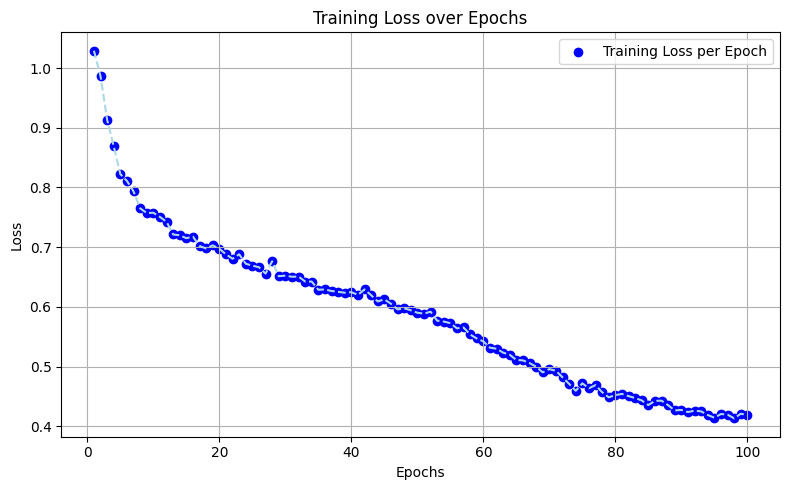

In [ ]:
plot_train_loss(trainer_B, 100)

#### Version C

The initial decrease in loss is very slow, until approximately 10 epochs, after which the loss very quickly drops. From the 20th epoch until the end, the loss very gradually and consistantly decreases. Towards the last epochs, it appears that the loss remains on a very shallow but downward trajectory, indicating that with more epochs, it is possible the loss would decrease further.

Training for approximately 200 epochs, or 300 epochs would yield more definate results. However this would likely take at least 3 hours to train, and would heavily consume GPU compute. Testing this is not feasible.

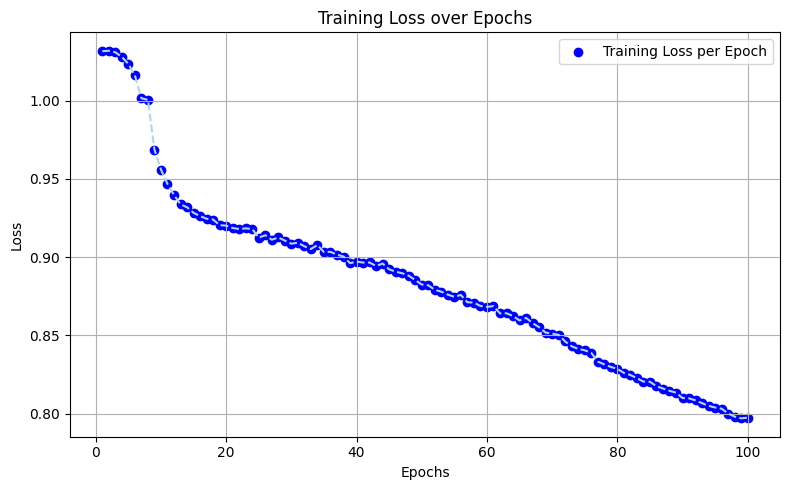

In [ ]:
plot_train_loss(trainer_C, 100)

#### Version D

Initially the loss was very high, at above 1.1, and it appeared to increase before staring its decline, although still remaining above a loss of 1. After about the 15th epoch, it suddenly rapidly dropped to around 0.3 at the 20th epoch. For the remaining epochs, it very gradually declined below 0.3, and would fluctuate between 0.27 and 0.29.

It is possible that with more epochs or a smaller learning rate, this loss can be further reduced.

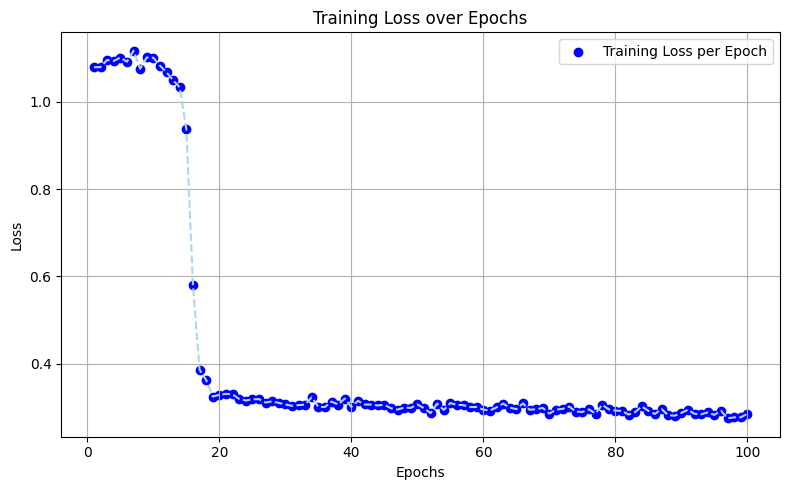

In [12]:
plot_train_loss(trainer_D, 100)

# **EVALUATION**

In this section, each model is evaluated on a subset of the validation dataset. The warped images are compared to the target images in the batch, and the corresponding depth maps are visualized.

The depth maps are visualized such that lighter colours (starting at yellow) indicate a high depth, meaning those areas are further from the camera. Darker colours (purple, blue) correspond to lower depth values, meaning those areas are closer to the camera.

The warped images are constructed using a source frame, and they are a prediction of what the next frame (target frame) would look like. They are computed using the depth map, and pose estimation to map the source to the predicted next frame.

The depth maps and warped images are studied, and possible explanations for the results are proposed. Using these observations, new models may be created to accomodate any changes that may improve performance.

Specifically, based on the results from Versions A, B, C, an issue is identified, and a new model D is created.

#### Helper functions

To visualize the target image, depth map and warped image.

In [13]:
# compare target image and warped source image, visualize depth map
def plot_results(tgt_np, depth_np, warped_np, idx):
  plt.figure(figsize=(15, 5))

  plt.subplot(1, 3, 1)
  plt.title(f"Target Image {idx}")
  plt.imshow(tgt_np)
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.title(f"Predicted Depth {idx}")
  plt.imshow(depth_np, cmap='plasma')
  plt.axis('off')

  plt.subplot(1, 3, 3)
  plt.title(f"Warped Source Image {idx}")
  plt.imshow(warped_np)
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [14]:
import torch.nn.functional as F
from depth_trainer import pose_vec2mat, project_3d

# visualize performance on subset of validation data
def val_results(depth_net, pose_net):
    # set the mode for the models
    depth_net.eval()
    pose_net.eval()

    # without adjusting gradients
    with torch.no_grad():

      # iterate over one batch
      for tgt, [src1, src2] in val_loader:

          # move to device
          tgt = tgt.to(device)
          src1 = src1.to(device)

          # calculate depth map
          disp = depth_net(tgt)
          disp = F.interpolate(disp, size=(224, 224), mode='bilinear', align_corners=True)
          depth = 1 / (disp + 1e-6)

          # pose estimation
          pose = pose_vec2mat(pose_net(tgt, src1))

          # construct warped image
          grid = project_3d(depth, intrinsics.to(device), pose)
          warped = F.grid_sample(src1, grid, padding_mode='border', align_corners=True)

          # iterate over images in the batch
          batch_size = tgt.size(0)
          for i in range(batch_size):
              # format values
              tgt_np = tgt[i].permute(1, 2, 0).cpu().numpy()
              depth_np = depth[i, 0].cpu().numpy()
              warped_np = warped[i].permute(1, 2, 0).cpu().numpy()

              # visualize results
              plot_results(tgt_np, depth_np, warped_np, i)

          break

## Version A Performance

The warped image is very similar to the target image, however the predicted depth map is almost entirely flat. This implies that the model has minimized loss to some trivial solution through collapse, and the accuracy of the warped source image is due to the reliablity of `grid_sample`. \\

During previous arbitrary tests, this learning rate has yielded a more accurate depth map that demonstrated the model's understanding of geometry in the scene. However during those previous tests, the depth map computation in the training loop was different, and had one additional step.
<br> <br>

Currently, the depth map is computed as follows:
>
```
disp = self.depth_net(tgt)
depth = 1 / (disp + 1e-6)  
```

Previously, the depth map was computed using the following:

>
```
disp = self.depth_net(tgt)
disp = F.interpolate(disp, size=(224, 224), mode='bilinear', align_corners=True)
depth = 1 / (disp + 1e-6)  
```

The line, `disp = F.interpolate(disp, size=(224, 224), mode='bilinear', align_corners=True)` was initially used to smoothen the disparity map. However since the resolution output from the depth network already matched the size (224, 224), it was assumed that the line of code was negligable. \\

Upon further review, it appears that this line of code does perform bilinear interpolation despite the size matching. This results in the disparity map being smoothed, and it acts as a low-pass filter, thus regularizing training. \\

This observation resulted in the creation of Version D, where the training parameters are identical to Version A (except with 100 epochs), but the depth map computation in the training loop is modified to include this line.

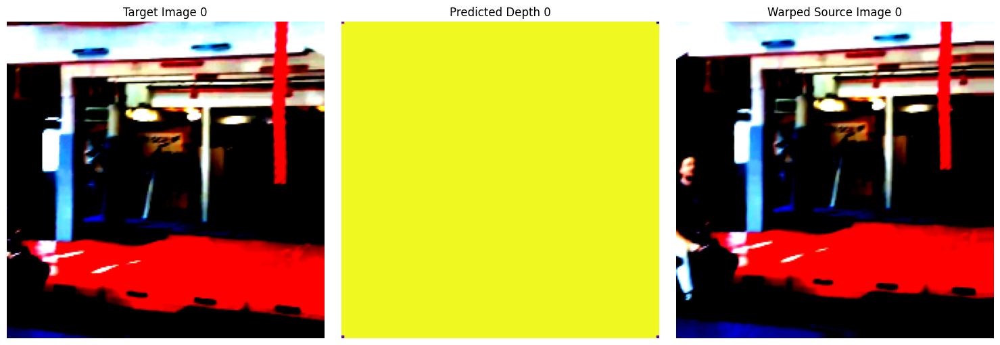

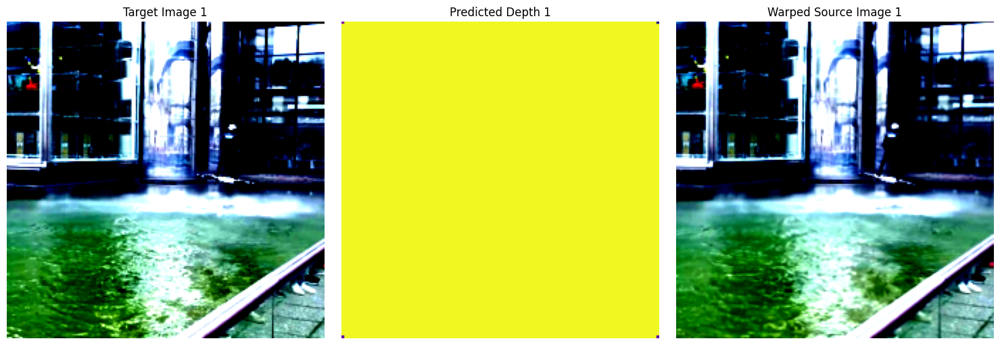

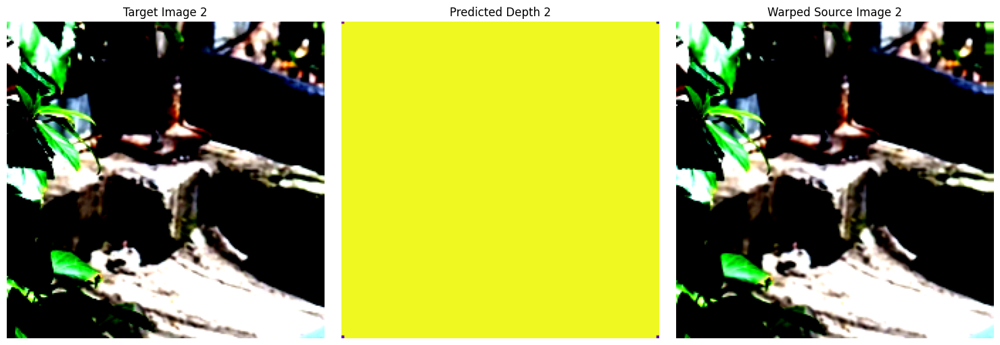

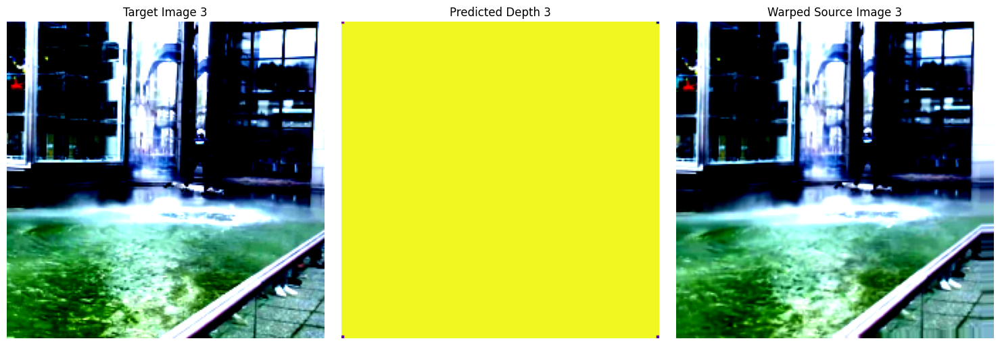

In [ ]:
val_results(depth_A, pose_A)

## Version B Performance

Similar to Version A, these results are indicative of collapse occuring during training. As discussed in the previous section, the removal of the smoothing step likely allowed for the depth network decoder output to be noisy. This possibly caused the model to converge at some local minimum. \\

Rather than a change in learning rate or training parameter, it appears the model would benefit more from a change in architecture or loss computation. The flat depth map indicates that the training was not stable, which demonstrates a need for a smoothing step. \\

The performance of both this version and version A motivated the creation of version D.

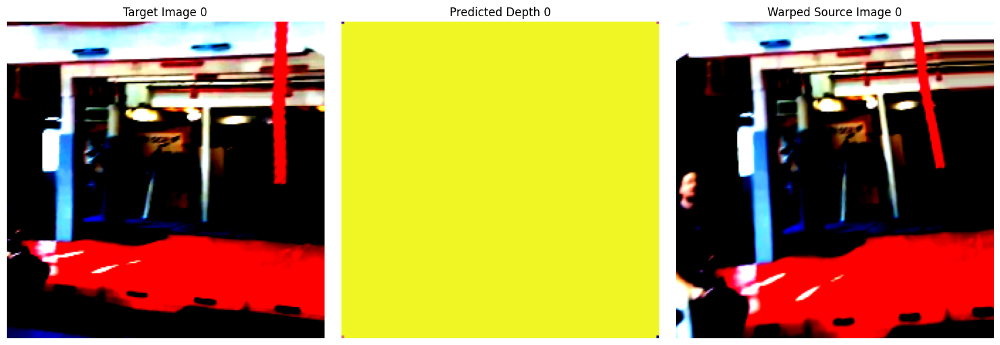

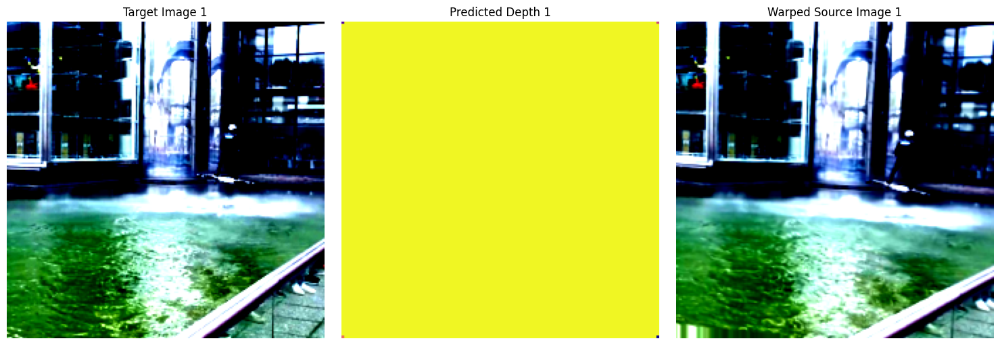

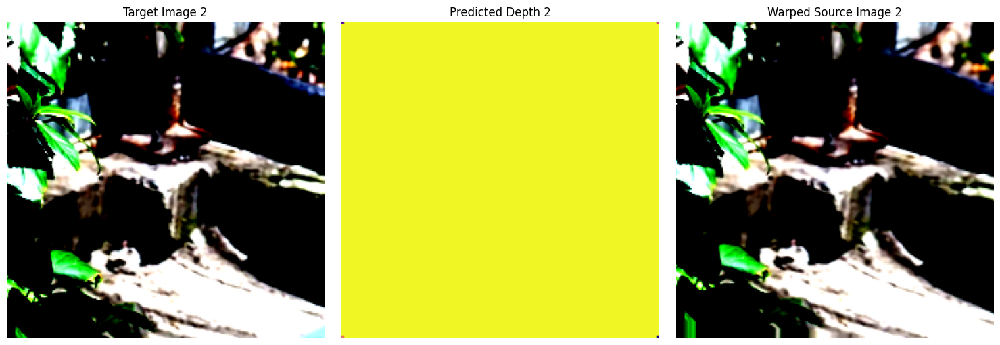

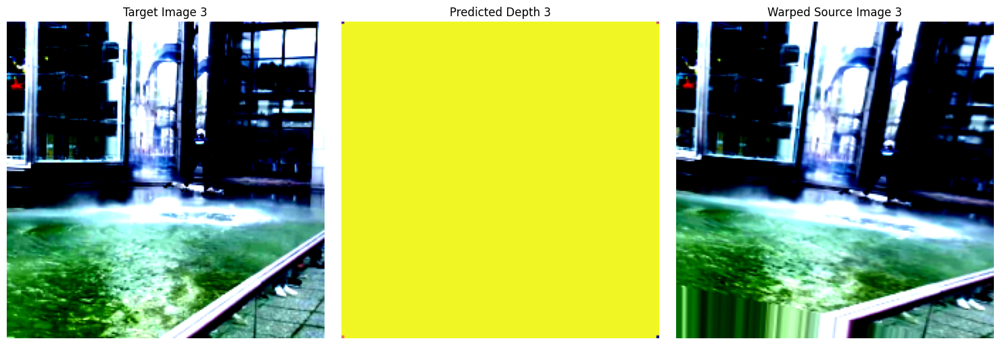

In [ ]:
val_results(depth_B, pose_B)

## Version C Performance

The results of this version are very different from the previous two versions. The warped image for the first, second, and fourth target images are completely inaccurate. However the corresponding depth maps, although inaccurate, indicate that the model has acquired some level of spatial, geometric understanding. The depth maps also do not appear to be random, as they appear to align with the scene, but not accurately.

The third warped image is very accurate to its target image, and the depth map also appears to be accurate.

Overall this demonstrates that the model has not yet experienced collapse like the previous two versions, and that is likely because the learning rate resulted in a much slower progression. With only 100 epochs, it likely did not reach the point where it could experience collapse.

It may also demonstrate that a smaller learning rate is more beneficial to this architecture as the model can learn the finer details in the data. In order for the model to benefit from training with this learning rate, it would need to train for at least 500 epochs.

However this solution is not neccessarily reliable for two reasons. Assuming the noisy disparity map will eventually cause collapse, increasing the number of epochs will not help as the model will eventually minimize the loss to some constant (collapse). On the other hand, ignoring the issue of collapse, training the model with a small learning rate over 500 epochs may result in overfitting and may negatively impact the generalizability of the model.

A more feasable solution would be to smoothen the disparity map, which can help the model generalize better, and can prevent convergence to a local minimum as well as prevent collapse.

This observation also motivates the creation of model D, rather than the creation of an additional model with a small learning rate and higher number of epochs.

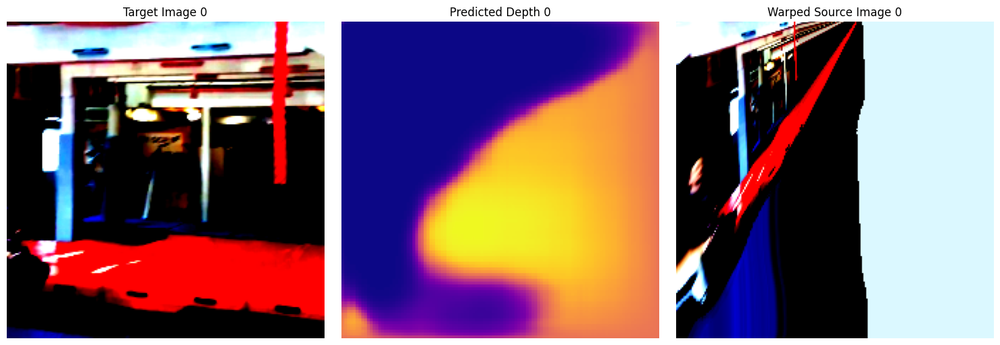

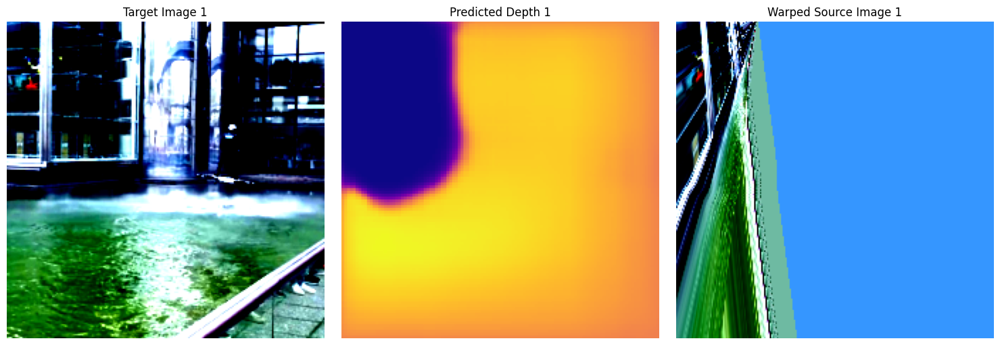

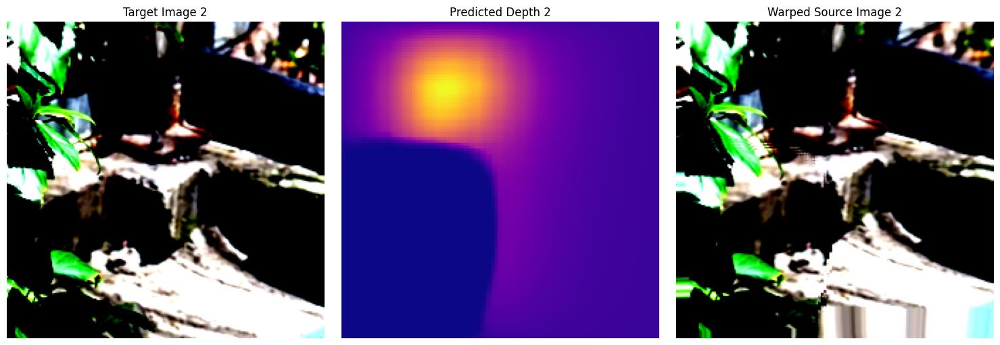

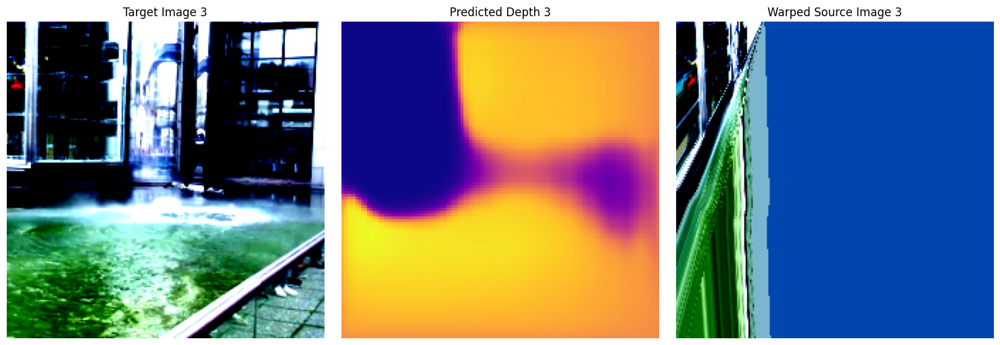

In [ ]:
val_results(depth_C, pose_C)

## Version D Performance

This version significantly improves on the performance of versions A, B and C. The warped images are very accurate to the target image, and the depth maps demonstrate an understanding of spatial geometry.

For the first image, the depth map indicates that the model was able to differenciate the object located midground from the foreground. However it appears to struggle with the background and midground object distinction. The yellow area appears to correspond to the object in the mid ground of the frame. The foreground appears to be much darker, which is accurate as it is closest to the camera. The edges near the top and right sides are not as accurate since they should be lighter than the area where the object is located.

The second image is more simple, and the depth map is accurate to the image. The background is appropriately coloured as yellow, and the race track where the cars are, are coloured darker blue to indicate that they are closer to the camera.

The depth map for the third image is also accurate, and the model is clearly able to distinguish the foreground, from the train in the midground, and the tree in the background.

For the last image, the depth map also demonstrates the model's understanding of spacial geometry. The yellow area in the top left corresponds to the mountain in the background, the pinkish-purple area close to the bottom left of the map corerspond to the skier in the midground, and the dark colours correspond to the foreground. The gradient colours of this depth map align with the objects in this frame.

Qualatively, this model demonstrates the best performance by far, and qualatively yields the lowest loss, and demonstrates potential for further reduction of loss. It may be improved by furter decreasing the learning rate, however considering the model's current performance, this would likely result in overfitting and poor generalization.

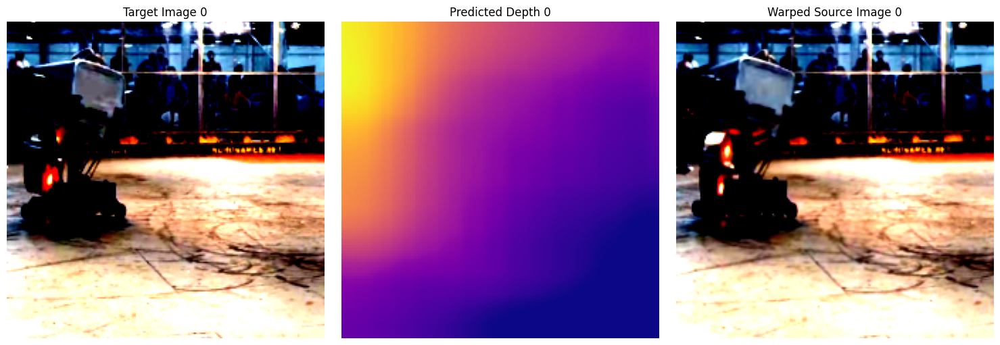

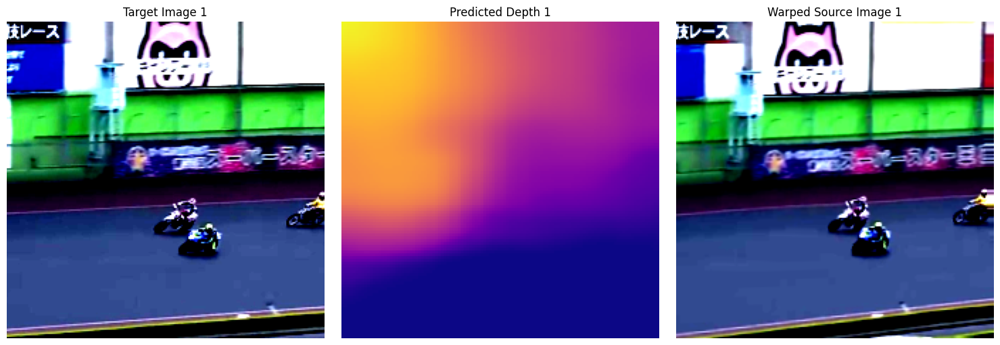

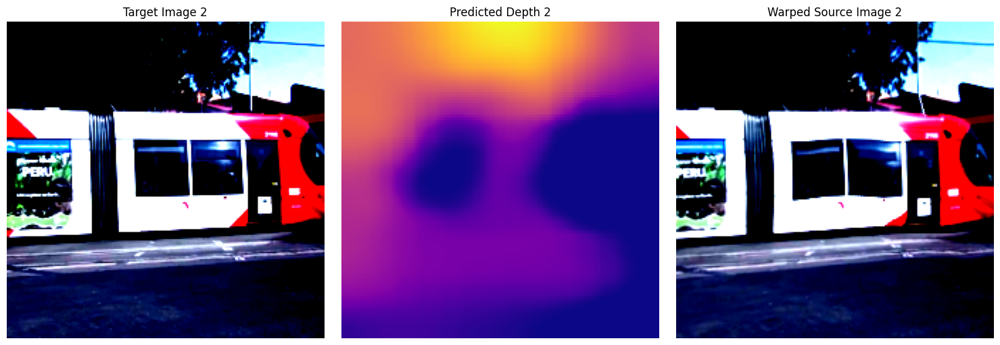

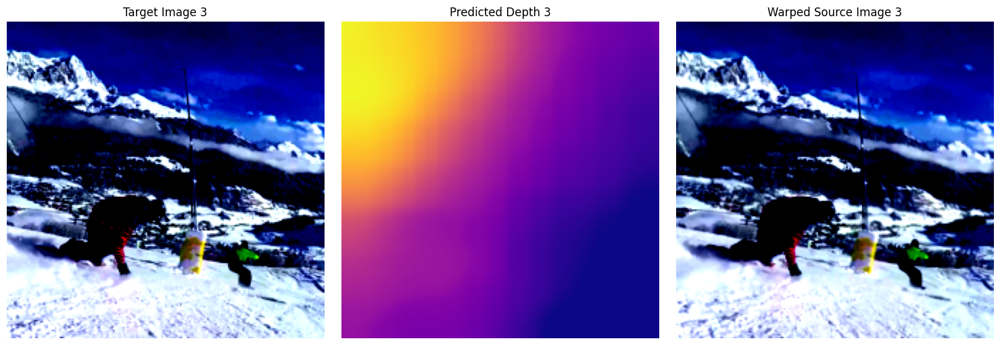

In [15]:
val_results(depth_D, pose_D)

# CONCLUSION

In the training analysis and the evaluation sections, it was established that Version D was the most effective version due to its incorporation of smoothing the disparity map.

It is likely that more learning rates will be further explored with the inclusion of the interpolation line. However the current state of the depth estimation module will be used in the rest of the pipeline until other versions are explored.

The following cells do not need to be run unless the weights are not already locally available

In [16]:
torch.save(depth_D.state_dict(), "depth_D_weights.pth")
torch.save(pose_D.state_dict(), "pose_D_weights.pth")

In [18]:
from google.colab import files

files.download("depth_D_weights.pth")
files.download("pose_D_weights.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>